# Setup Code

In [1]:
# Install environment and agent
!pip install highway-env==1.5
# TODO: we use the bleeding edge version because the current stable version does not support the latest gym>=0.21 versions. Revert back to stable at the next SB3 release.
!pip install git+https://github.com/DLR-RM/stable-baselines3

# Environment
import gym
import highway_env

# Agent
from stable_baselines3 import PPO
from stable_baselines3 import DQN
# Visualization utils
%load_ext tensorboard
import sys
from tqdm.notebook import trange
!sudo apt-get update
!apt update
!apt install xvfb
!pip install pyvirtualdisplay
#!pip install tensorboardx gym pyvirtualdisplay
#!apt-get install -y xvfb python-opengl ffmpeg
!git clone https://github.com/eleurent/highway-env.git 2> /dev/null
sys.path.insert(0, '/content/highway-env/scripts/')
from utils import record_videos, show_videos

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 103 kB 10.7 MB/s 
     |████████████████████████████████| 21.8 MB 6.2 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/DLR-RM/stable-baselines3 to /tmp/pip-req-build-awa0p9j3
  Running command git clone -q https://github.com/DLR-RM/stable-baselines3 /tmp/pip-req-build-awa0p9j3
     |████████████████████████████████| 1.5 MB 15.1 MB/s 
  Created wheel for stable-baselines3: filename=stable_baselines3-1.7.0a3-py3-none-any.whl size=168892 sha256=ce28390a24d891874befc3698cefeb0627249e357c9484b5b636c4d3fe5a20f0
  Stored in directory: /tmp/pip-ephem-wheel-cache-lsz_brdk/wheels/2b/88/65/5d0cb266b061107af8c518096240bea8578e9843716f79e4da
  Created wheel for gym: filename=gym-0.21.0-py3-none-any.whl size=1616822 sha256=473da7331da44d2c64afa24d229b9ac088d07fbbf2b33470722a1d015

# Making an environment

{'action': {'target_speeds': [0, 8, 16], 'type': 'DiscreteMetaAction'},
 'centering_position': [0.5, 0.6],
 'collision_reward': -1,
 'duration': 11,
 'high_speed_reward': 0.2,
 'incoming_vehicle_destination': None,
 'lane_change_reward': -0.05,
 'manual_control': False,
 'observation': {'absolute': True,
                 'features_range': {'vx': [-15, 15],
                                    'vy': [-15, 15],
                                    'x': [-100, 100],
                                    'y': [-100, 100]},
                 'type': 'Kinematics'},
 'offscreen_rendering': False,
 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle',
 'policy_frequency': 1,
 'real_time_rendering': False,
 'render_agent': True,
 'right_lane_reward': 0,
 'scaling': 5.5,
 'screen_height': 600,
 'screen_width': 600,
 'show_trajectories': False,
 'simulation_frequency': 15}


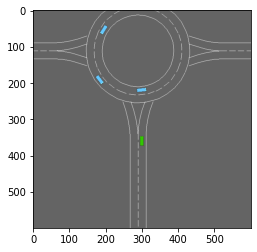

In [2]:
# environment base
import pprint
import gym
import highway_env
from matplotlib import pyplot as plt
%matplotlib inline
env = gym.make("roundabout-v0")
pprint.pprint(env.config)
plt.imshow(env.render(mode="rgb_array"))
plt.show()

In [3]:
#environment configuration
env.config["duration"]=20
env.config["show_trajectories"]=True
env.config["high_speed_reward"]=0.4
env.config["right_lane_reward"]=0.2
env.config["lane_change_reward"]=0.1
env.config["screen_width"]=1000
env.config["screen_height"]=1000
env.config["scaling"]=7.5
env.reset()
pprint.pprint(env.config)

{'action': {'target_speeds': [0, 8, 16], 'type': 'DiscreteMetaAction'},
 'centering_position': [0.5, 0.6],
 'collision_reward': -1,
 'duration': 20,
 'high_speed_reward': 0.4,
 'incoming_vehicle_destination': None,
 'lane_change_reward': 0.1,
 'manual_control': False,
 'observation': {'absolute': True,
                 'features_range': {'vx': [-15, 15],
                                    'vy': [-15, 15],
                                    'x': [-100, 100],
                                    'y': [-100, 100]},
                 'type': 'Kinematics'},
 'offscreen_rendering': False,
 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle',
 'policy_frequency': 1,
 'real_time_rendering': False,
 'render_agent': True,
 'right_lane_reward': 0.2,
 'scaling': 7.5,
 'screen_height': 1000,
 'screen_width': 1000,
 'show_trajectories': True,
 'simulation_frequency': 15}


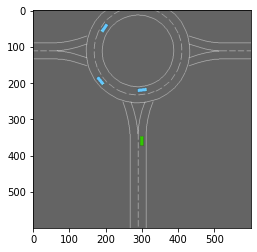

In [4]:
plt.imshow(env.render(mode="rgb_array"))
plt.show()

## Training
Run tensorboard locally to visualize training.

In [5]:
%tensorboard --logdir "roundabout"

<IPython.core.display.Javascript object>

In [6]:
model = DQN('MlpPolicy', env,
            policy_kwargs=dict(net_arch=[256, 256]),
            learning_rate=5e-4,
            buffer_size=15000,
            learning_starts=200,
            batch_size=32,
            gamma=0.8,
            train_freq=1,
            gradient_steps=1,
            target_update_interval=50,
            verbose=1,
            tensorboard_log="roundabout/")
model.learn(int(2000)) # 2000 trainings


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Logging to roundabout/DQN_1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 8.25     |
|    ep_rew_mean      | 6.96     |
|    exploration_rate | 0.843    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 2        |
|    time_elapsed     | 12       |
|    total_timesteps  | 33       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 9.62     |
|    ep_rew_mean      | 8.11     |
|    exploration_rate | 0.634    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 3        |
|    time_elapsed     | 19       |
|    total_timesteps  | 77       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
| 

## Testing

Visualize a few episodes

In [7]:
# Use roundabout model
env = record_videos(env)
for episode in trange(5, desc="Test episodes"):
    obs, done = env.reset(), False
    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, done, info = env.step(int(action))
env.close()
show_videos()


Test episodes:   0%|          | 0/5 [00:00<?, ?it/s]